# ELEC 221 Assignment 6: radio 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
from scipy.signal import butter
from scipy.io import wavfile
from IPython.display import Audio, Image
import math
from IPython.core.display import HTML

In [7]:
def fftAndShift(signal):
    return np.fft.fftshift(np.fft.fft(signal))
def getFrequencies(signal,sampleRate):
    return np.fft.fftshift(np.fft.fftfreq(len(signal),1/sampleRate))

In this problem, you'll implement a simulated AM radio system that is a little more realistic in terms of the operation of the receiver and demodulation process. 

Suppose you and your colleague have been put in charge of a radio broadcast company that manages 5 stations at the following frequencies (in kHz): 580, 600, 620, 640, and 660. Note that typically, AM is used for talk radio, which requires a bandwidth of ~10 kHz. However to make things interesting, we're going to use music which requires a wider range.

**Question 0.1 (1 point)**. To make things more meaningful for you (hopefully!), choose five songs, perhaps of different genres, for your radio stations. Select ~4-5s clips of each, and use a sampling rate of somewhere between 40000-48000.

In [2]:
# Prepare some samples and load them in here.
# input_audio = wavfile.read("my_song.wav") 

# The result of importing a wavfile should be a tuple of two elements:
# the sample rate, and the audio signal, which may be have multiple channels.
# sample_rate = input_audio[0]

# My audio sample had multiple channels. Yours may not.
# In my case, I took just one of these channels, and converted it from 
# integer values to floats.
# channel_0 = input_audio[1][:, 0]
# song_1 = np.array(channel_0, dtype=np.float64) / np.max(channel_0)

commonSampleRate=48000

songPaths=["InMyRoom","Temptation","ComeAsYouAre", "LivinInMyTruth","NightDrive"]
songList=[]
for path in songPaths:
    song_audio=wavfile.read(path+".wav")
    sample_rate=song_audio[0]
    song=np.array(song_audio[1][:,0],dtype=np.float64)
    song=scipy.signal.resample(song,int(commonSampleRate/sample_rate)*len(song))
    song=song[:250000]
    songList.append(song)
    display(Audio(song,rate=commonSampleRate))
    
# song1_audio=wavfile.read("song1.wav")
# sample_rate=song1_audio[0]
# print(sample_rate)
# print(song1_audio[1].shape)
# song_1=np.array(song1_audio[1][:,0],dtype=np.float64)
# Audio(song_1,rate=sample_rate)

In [3]:
song_1 = songList[0]
song_2 = songList[1]
song_3 = songList[2]
song_4 = songList[3]
song_5 = songList[4]

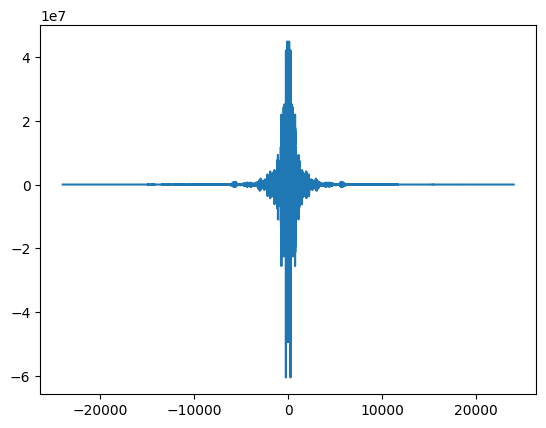

In [8]:
frequencies=getFrequencies(song_1,commonSampleRate)
plt.plot(frequencies,fftAndShift(song_1))

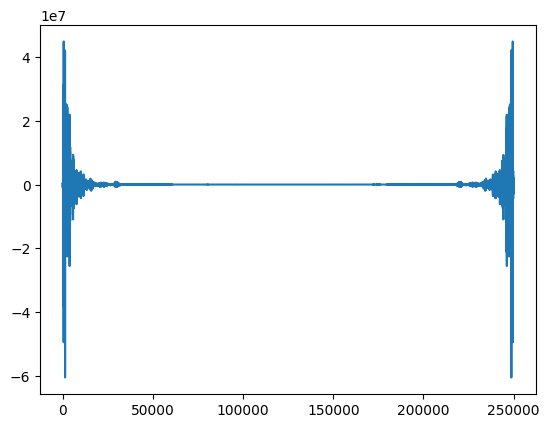

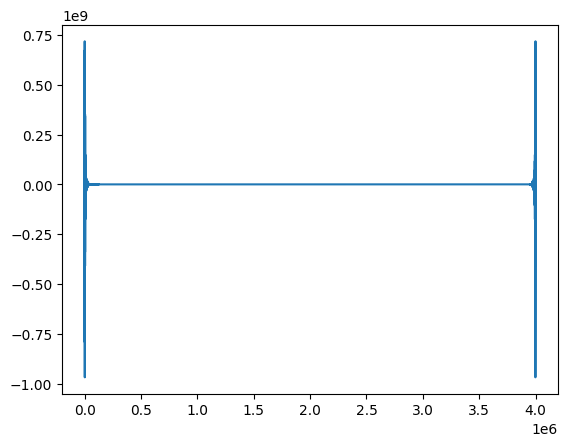

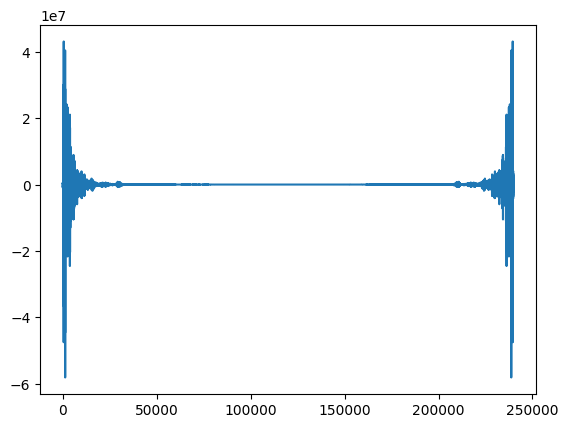

In [9]:
# testing up/downsampling
plt.plot(np.fft.fft(song_1))
plt.show()
resampled1=scipy.signal.resample(song_1,int(800000/48000)*len(song_1))
plt.plot(np.fft.fft(resampled1))
plt.show()
resampled2=scipy.signal.resample(resampled1,int((48000/800000)*len(resampled1)))
plt.plot(np.fft.fft(resampled2))
plt.show()
display(Audio(resampled2,rate=48000))

## Part 1. The broadcast

We will begin by setting up the broadcast process according to the following block diagram:

<img src="broadcast.png" width=700>

We'll do this in a couple different steps.

**Question 1.1 (1 point)**. First, design a lowpass filter to reduce the bandwidth of a signal to within the acceptable range of our radio stations.

In [10]:
def reduce_signal_bandwidth(signal,sampleRate,amplify=False):
    """Reduce the bandwidth of a signal to within a ~20 kHz band.
    
    Here, 20 kHz corresponds to the space a signal will take when considering
    both positive and negative frequencies, like we have seen during the 
    amplitude modulation lectures in class. 
    
    It is up to you to decide how to filter it. You may choose to use an 
    ideal brick wall filter, or a more realistic non-ideal filter (it doesn't
    need to be exactly 20 kHz wide, just something appropriate for the
    application).
    
    I'm using a brickwall filter
    
    Args:
        signal (array[float]): A real-valued signal.
        int sampleRate: sample rate of the signal
        Boolean amplify: Add a gain of 2 to the pass band of the brick wall filter
        
    Returns:
        array[float]: A signal that has been filtered so that its spectrum is 
        band-limited. 
    """
    fourier_spectrum=np.fft.fft(signal)
    frequencies=np.fft.fftfreq(len(fourier_spectrum),1/sampleRate)
    
    for index in range(int(len(frequencies)/2)):
        if frequencies[index]>10000: # 20 kHz wide not 20 kHz cutoff
            fourier_spectrum[index]=0
            fourier_spectrum[-index]=0
        elif amplify:
            fourier_spectrum[index]=2*fourier_spectrum[index]
            fourier_spectrum[-index]=2*fourier_spectrum[-index]
    
    return np.fft.ifft(fourier_spectrum)

In [11]:
lpFilteredSongs=[]
for song in songList:
    lpFilteredSongs.append(reduce_signal_bandwidth(song,commonSampleRate))


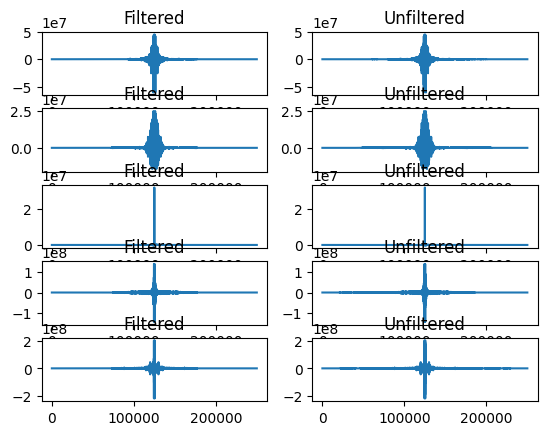

In [12]:
fig, ax = plt.subplots(5,2)
for i in range(len(lpFilteredSongs)):
    ax[i][0].plot(np.fft.fftshift(np.fft.fft(lpFilteredSongs[i])))
    ax[i][0].set_title("Filtered")
    ax[i][1].plot(np.fft.fftshift(np.fft.fft(songList[i])))
    ax[i][1].set_title("Unfiltered")

**Question 1.2 (1 point)** Implement a function that performs sinusoidal amplitude modulation (with a $\cos$ carrier signal) of a signal into the frequency range of a desired radio station.

In [67]:
def sinusoidal_amplitude_modulation(signal, station_frequency, sampleRate , phase=0.0):
    """Modulate a signal up to the frequency of a desired AM radio station.
    
    The amplitude modulation should have the form:
       y(t) = x(t) * c(t) = x(t) * cos(2 * π * f_c * t + θ_c) 
    where f_c is the carrier (station) frequency, and θ_c is a phase.
    
    Args:
        signal (array[float]): A real-valued signal.
        station_frequency (int): The (carrier) frequency of the station, in kHz.
        phase (float): The phase of the carrier signal. 
        sampleRate: sampleRate of the signal
        
    Returns:
        array[float]: The modulated signal.
    """
    return np.array([(signal[t]*math.cos((2*np.pi*station_frequency*1000*t/sampleRate)+phase)) for t in range(len(signal))])

**Question 1.3 (1 point)**. Your radio company will use frequency-division multiplexing (FDM) to send multiple signals over the same channel. Using the frequencies listed above, implement a broadcast (transmission) system that takes a set of signals as input, and outputs the full radio broadcast.

In [14]:
def broadcast(signals, commonSampleRate):
    """Broadcast a set of signals at different frequencies to simulate 
    a set of radio stations.
    
    This function should:
      - reduce the bandwidth of each of the provided signals
      - modulate each one to the correct frequency range
      - perform FDM to generate a combined output signal to be broadcast
    
    Args:
        signals (list[array[float]]): A list of signals to be transmitted. 
             Assume that they are provided in order of increasing station frequency.
    
    Returns:
        array[float]: A single channel contain the frequency-division multiplexed
        set of signals.
    """
    freqList=[580,600,620,640,660]
    toBroadcast=np.zeros(signals[0].shape)
    
    for i in range(len(freqList)):
        reducedBandwidth=reduce_signal_bandwidth(signals[i],commonSampleRate)
        toBroadcast=np.add(toBroadcast,sinusoidal_amplitude_modulation(reducedBandwidth, freqList[i], commonSampleRate))
    
    return toBroadcast

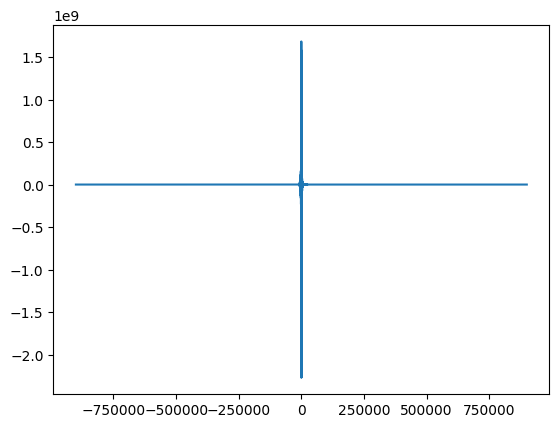

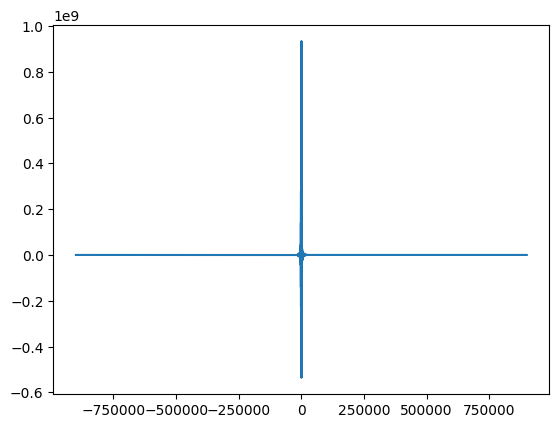

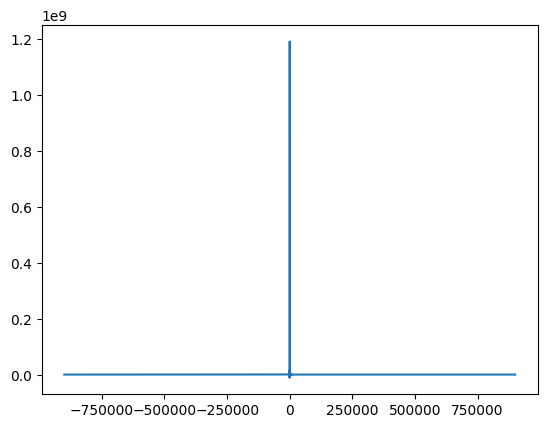

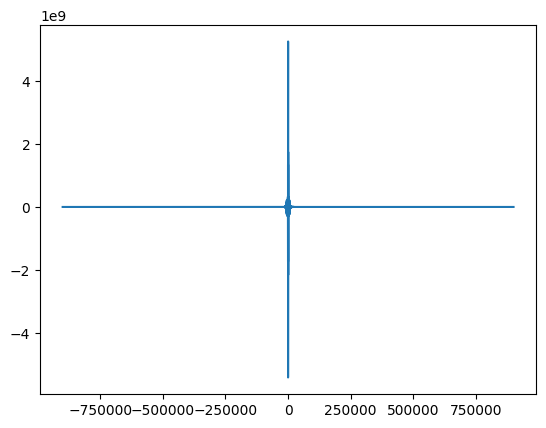

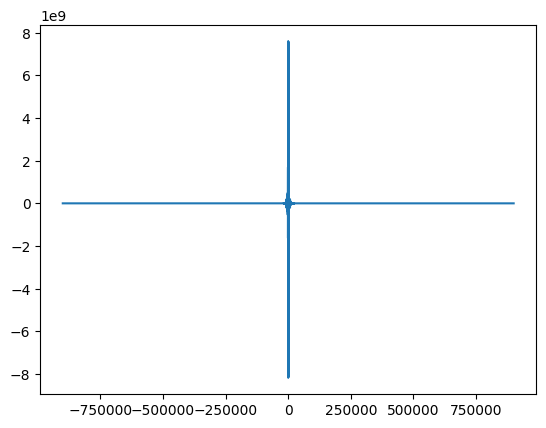

In [15]:
# upsample all songs so that they can be broadcast with the radio frequencies.

toBroadcast=[]
broadcastSampleRate=1800000
for i in range(len(songList)):
    toBroadcast.append(scipy.signal.resample(songList[i],int(broadcastSampleRate/commonSampleRate*len(songList[i]))))


for i in range(len(toBroadcast)):
    fourier_spectrum=np.fft.fft(toBroadcast[i])
    frequencies=np.fft.fftfreq(len(fourier_spectrum),1/broadcastSampleRate)
    plt.plot(np.fft.fftshift(frequencies), np.fft.fftshift(fourier_spectrum))
    plt.show()

In [18]:
broadcastSignal=broadcast(toBroadcast,broadcastSampleRate)

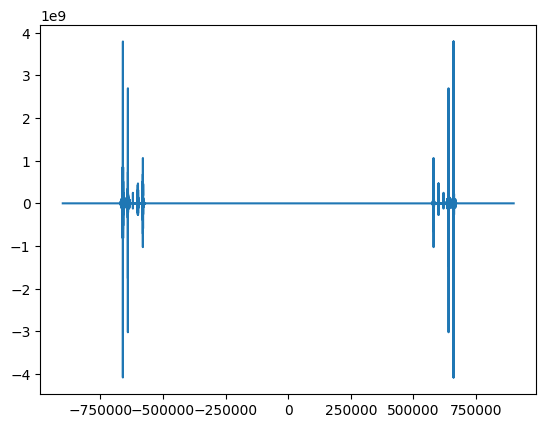

In [18]:
# fourier spectrum of broadcast signal
plt.plot(np.fft.fftshift(np.fft.fftfreq(len(broadcastSignal),1/broadcastSampleRate)),np.fft.fftshift(np.fft.fft(broadcastSignal)))

## Part 2. A simple receiver

In order to test your broadcasting setup, let's implement a simple synchronous demodulation system.

**Question 2.1 (1 point)** Complete the function below to implement the synchronous demodulation system that we described in class (see the docstring below for details). 

In [16]:
def bandpassFilter(signal,lowerBand,upperBand,sampleRate):
    fourier_spectrum=np.fft.fft(signal)
    frequencies=np.fft.fftfreq(len(fourier_spectrum),1/sampleRate)
    
    for index in range(int(len(frequencies)/2)):
        if frequencies[index]<lowerBand:
            fourier_spectrum[index]=0
            fourier_spectrum[-index]=0
        elif frequencies[index]>upperBand:
            fourier_spectrum[index]=0
            fourier_spectrum[-index]=0
    return np.fft.ifft(fourier_spectrum)

In [88]:
def simple_receiver(broadcast, station_frequency,broadcastSampleRate, phase=0.0, bandpass=True,lpf=True,plotAlongTheWay=False):
    """Demodulate the radio broadcast and extract a desired station.
    
    This function should:
      - apply a bandpass filter (if specified) to the signal to extract
        only the parts of the spectrum in the desired station's frequency range
      - demodulate with a sinusoidal carrier (use cos) at the desired frequency
      - apply a low-pass filter with the appropriate gain to recover the signal
    
    Args:
        broadcast (array[float]): A radio broadcast consisting of five channels
            that have been FD multiplexed.
        station_frequency (int): The frequency (in kHz) of the radio station.
        phase (float): The phase of the demodulating signal.
        bandpass (bool): Whether or not to apply a bandpass filter before
            demodulating and filtering.
        lpf (bool): Whether or not to apply a lowpass filter after demodulation. 
    
    Returns:
        array[float]: The signal of the radio station at the desired frequency.
    """
    
#     plt.plot(getFrequencies(broadcast,broadcastSampleRate), fftAndShift(broadcast))
#     plt.show()
    
    if bandpass:
        broadcast=bandpassFilter(broadcast,(station_frequency-10)*1000,(station_frequency+10)*1000,broadcastSampleRate)
        if plotAlongTheWay:
            print("Bandpassed Signal")
            plt.plot(getFrequencies(broadcast,broadcastSampleRate), fftAndShift(broadcast))
            plt.show()
    else:
        print("bandpass skipped")
    
    
    demodulated=sinusoidal_amplitude_modulation(broadcast,station_frequency,broadcastSampleRate,phase)
    
    if plotAlongTheWay:
        print("Demodulated Signal")
        plt.plot(getFrequencies(demodulated,broadcastSampleRate), fftAndShift(demodulated))
        plt.show()
    
    if lpf:
        returnSignal= reduce_signal_bandwidth(demodulated,broadcastSampleRate,True)
        if plotAlongTheWay:
            print("Low Pass Filtered After Modulation")
            plt.plot(getFrequencies(returnSignal,broadcastSampleRate), fftAndShift(returnSignal))
            plt.show()
        return returnSignal
    
    return demodulated

**Question 2.2 (0.5 point)**. Test your demodulation function below to extract the 600 kHz station.

Bandpassed Signal


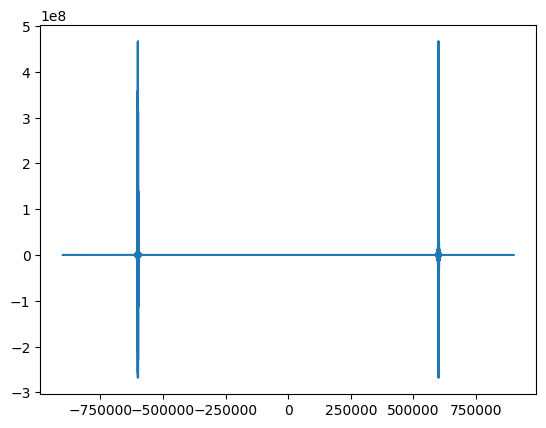

Demodulated Signal


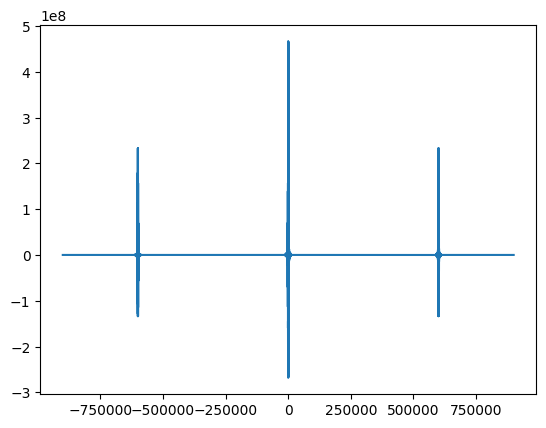

Low Pass Filtered After Modulation


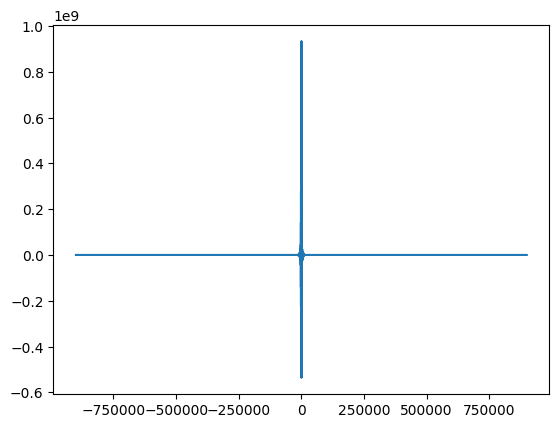

In [84]:
# fourier spectrum of recieved signal
recievedSignal=simple_receiver(broadcastSignal,600,broadcastSampleRate,0,True,True,True)
#plt.plot(np.fft.fftshift(np.fft.fftfreq(len(recievedSignal),1/broadcastSampleRate)),np.fft.fftshift(np.fft.fft(recievedSignal)))

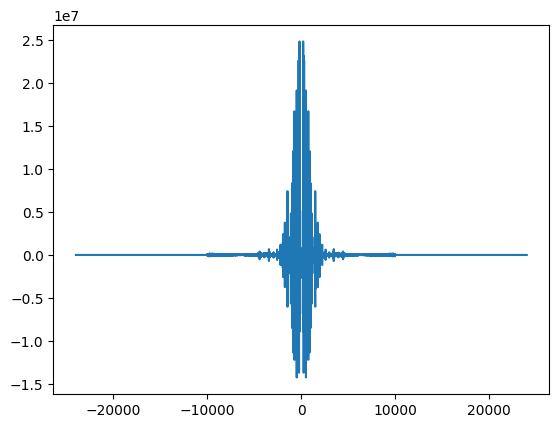

In [85]:
#downsampling the recieved signal to make it playable
downsampledRecieved=scipy.signal.resample(recievedSignal,int(commonSampleRate/broadcastSampleRate*len(recievedSignal)))
plt.plot(np.fft.fftshift(np.fft.fftfreq(len(downsampledRecieved),1/commonSampleRate)),np.fft.fftshift(np.fft.fft(downsampledRecieved)))

In [86]:
# playing the recieved signal! WOW!
display(Audio(downsampledRecieved,rate=commonSampleRate))

In [89]:
freqList=[580,600,620,640,660]
for freq in freqList:
    recievedSignal=simple_receiver(broadcastSignal,freq,broadcastSampleRate,0,True)
    downsampledRecieved=scipy.signal.resample(recievedSignal,int(commonSampleRate/broadcastSampleRate*len(recievedSignal)))
    display(Audio(downsampledRecieved,rate=commonSampleRate))

**Question 2.3 (0.5 point)**. Test your demodulation function with a non-zero phase; what happens to the output signal when the modulation and demodulation are not perfectly in sync?

As can be seen in the plots of the spectra below, as modulation and demodulation are not perfectly in sync, there can be interference between the signals, causing the lower (in magnitude) fourier transforms seen below. The most destructive case occurse when the phase is $\frac{pi}{2}$. The destructiveness at other frequencies is not audible due to way python is amplifying the audio when playing but is visible in the scaling of the y axis of the fourier transforms.

phase = 0.0 pi


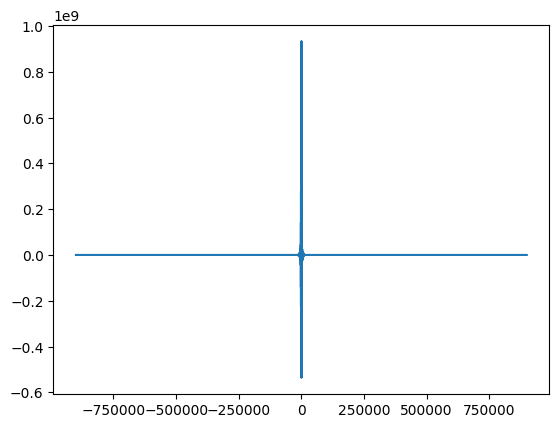

phase = 0.25 pi


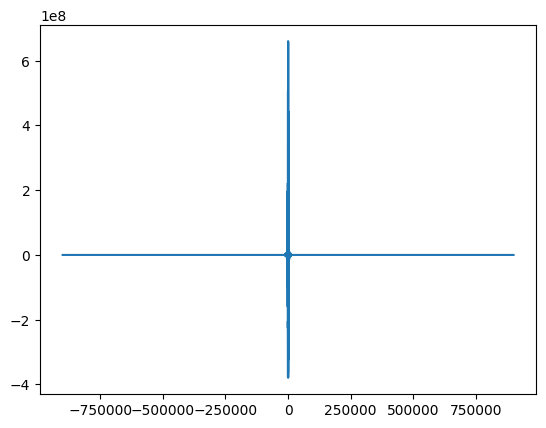

phase = 0.5 pi


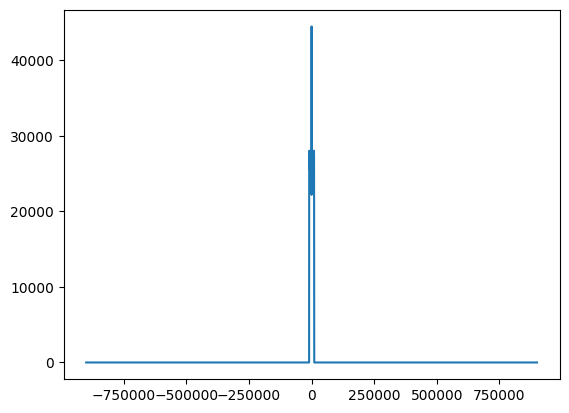

phase = 0.75 pi


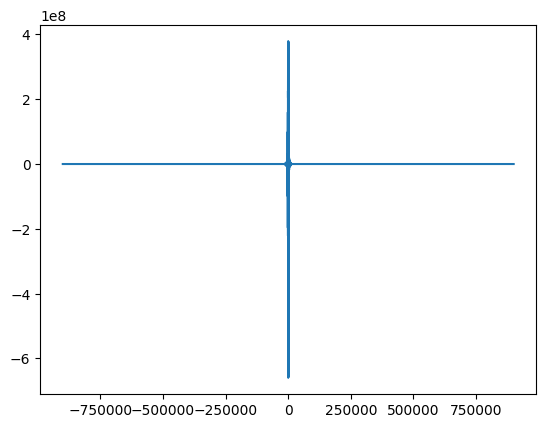

phase = 1.0 pi


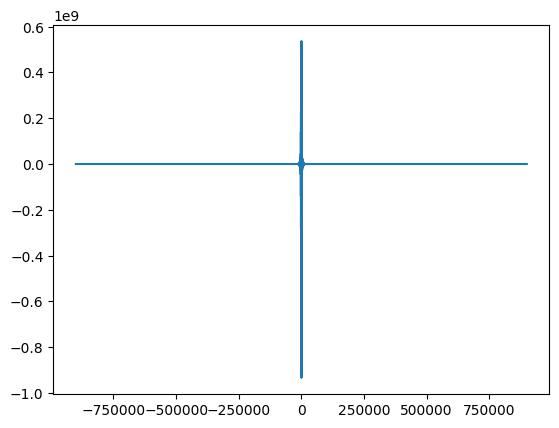

In [90]:
for i in np.linspace(0,np.pi,5):
    print("phase = "+str(i/(np.pi))+" pi")
    recievedSignal=simple_receiver(broadcastSignal,600,broadcastSampleRate,i,True)
    plt.plot(getFrequencies(recievedSignal,broadcastSampleRate),fftAndShift(recievedSignal))
    plt.show()
    downsampledRecieved=scipy.signal.resample(recievedSignal,int(commonSampleRate/broadcastSampleRate*len(recievedSignal)))
    display(Audio(downsampledRecieved,rate=commonSampleRate))

**Question 2.4 (0.5 point)**. Set `bandpass=False` and test the demodulation; how does it sound?

#### Ans:

While setting bandpass to false does not appear to change the sound of my output, if I set bandpass to false and do not low pass filter after demodulation, I have parts of another signal that superimpose on the spectrum of the desired output signal. If I only set bandpass to false, these parts of the spectrum are simply filtered out by the low pass filter. But when the lowpass filter is not applied this causes some high pitched noise added to the signal (corresponding to shifted frequency components of a nearby station)

bandpass skipped
Demodulated Signal


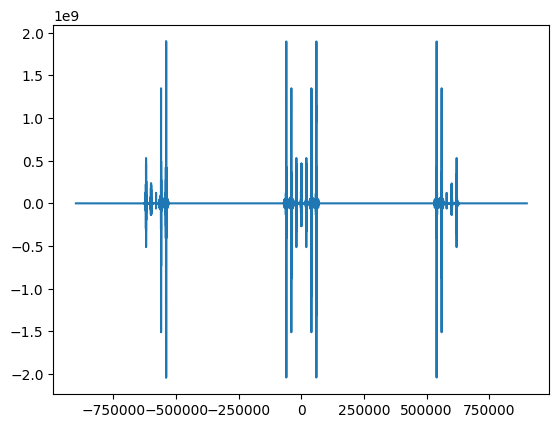

In [97]:
# fourier spectrum of recieved signal with no bandpass and no low pass
recievedSignal=simple_receiver(broadcastSignal,600,broadcastSampleRate,0,False,False,True)

bandpass skipped
Demodulated Signal


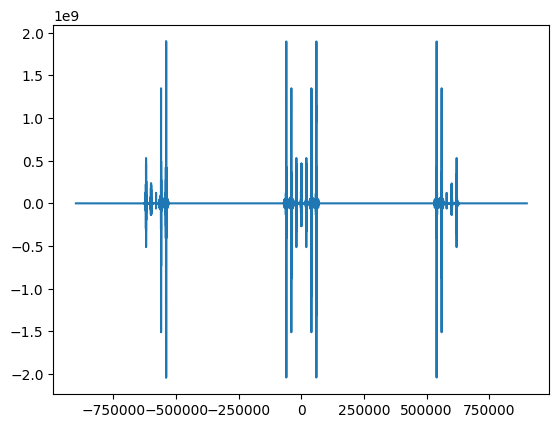

Low Pass Filtered After Modulation


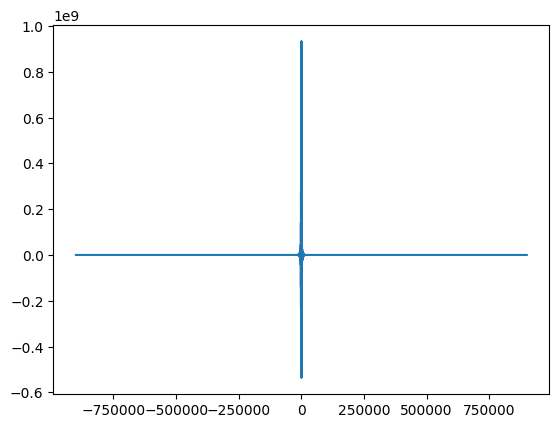

In [96]:
# fourier spectrum of recieved signal with no bandpass
recievedSignal=simple_receiver(broadcastSignal,600,broadcastSampleRate,0,False,True,True)

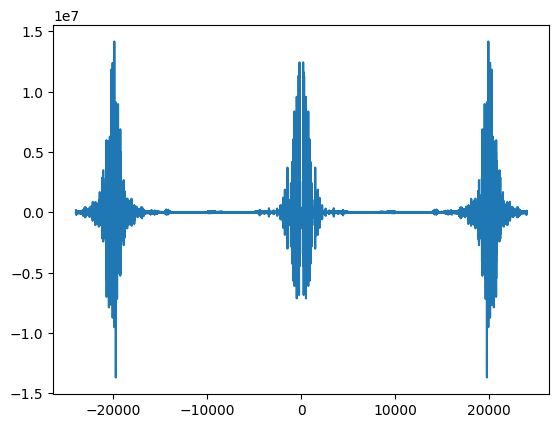

In [98]:
#downsampling the recieved signal to make it playable
downsampledRecieved=scipy.signal.resample(recievedSignal,int(commonSampleRate/broadcastSampleRate*len(recievedSignal)))
display(Audio(downsampledRecieved,rate=commonSampleRate))
plt.plot(np.fft.fftshift(np.fft.fftfreq(len(downsampledRecieved),1/commonSampleRate)),np.fft.fftshift(np.fft.fft(downsampledRecieved)))
plt.show()

**Question 2.5 (0.5 point)**. Try demodulating with an invalid station frequency (e.g., 590, 610, anything that sits in between our allotted values). Does this sound like you expect?

#### Ans:
I initially expected this to sound like a garbled mix of the two closest stations, only lower frequencies from the station with lower frequency and only the higher from the station with higher frequencies. Instead it sounds very high pitched. From the fourier spectrum, I can see that the signal only contains the lower part of the half of the fourier spectrum, shifted up, of the signal from the lower nearest frequency station, which makes sense given the operations that we are doing (i.e. low pass filtered after demodulation). The shift up gives the higher pitched sound that we hear.

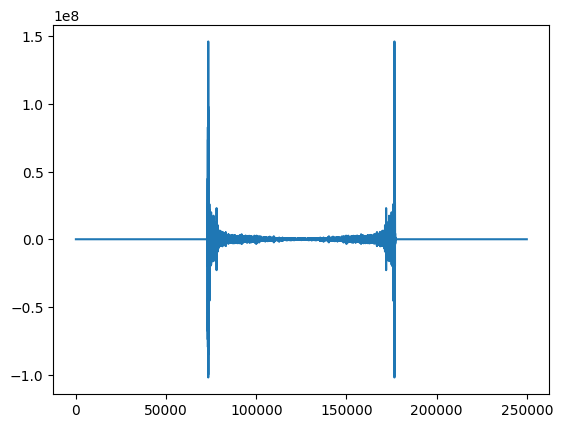

In [34]:
# fourier spectrum of recieved signal
recievedSignal=simple_receiver(broadcastSignal,650,broadcastSampleRate,0,True)
#downsampling the recieved signal to make it playable
downsampledRecieved=scipy.signal.resample(recievedSignal,int(commonSampleRate/broadcastSampleRate*len(recievedSignal)))
display(Audio(downsampledRecieved,rate=commonSampleRate))
plt.plot(np.fft.fftshift(np.fft.fft(downsampledRecieved)))

## Part 3: the superheterodyne receiver

In practice, AM radio is demultiplexed and demodulated by a system called the [superheterodyne receiver](https://en.wikipedia.org/wiki/Superheterodyne_receiver) (or superhet for short). Consider the (simplified) diagram below (there should in principle be some amplifiers in here, but we will ignore them):

<img src="superhet.png" width="800">

Here, $y(t)$ corresponds to the multiplexed signal that your broadcast outputs. This is put through a coarse tunable bandpass filter (this corresponds to you turning the radio dial), then mixed with a variable-frequency local oscillator to produce a signal centered at an intermediate frequency (IF) of 455 kHz. Said signal is then put through a fixed bandpass filter before being sent to the demodulator.

**Question 3.0 (0.5 point)**: Why do you think this kind of setup is used; why not just use a simple tunable filter from the get go? (You may need to do a little research on the history of the development of radio.)

From information that I have found online, it appears that one reason is historic, since the broadcast abnd in the US begins at 530 kHz, there is low risk of any stations interefering with the intermediate frequency. Additionally having a constant intermediate frequency may be more cost effective as this allows you to have a fixed filter which may not be as easy to configure as a variable oscillator. 

**Question 3.1 (1 point)**: Implement the heterodyning process in the the graphic above. The function should take the multiplexed signal as input and a desired radio station frequency, and output the demodulated audio signal.

In [59]:
def superhet_receiver(radio_broadcast, station_frequency, broadcastSampleRate):
    """Implement a simplified superheterodyne receiver to extract a desired station.
    
    This function should:
      - apply a bandpass filter to the signal to extract the correct 
        frequency regime 
      - use a local oscillator (frequency related to the bandpass) to yield an
        intermediate frequency signal at 455 kHz
      - apply a fixed bandpass filter and then demodulate to recover the station
    
    Args:
        broadcast (array[float]): A radio broadcast consisting of five channels
            that have been FD multiplexed.
        station_frequency (int): The frequency (in kHz) of the radio station.
    
    Returns:
        array[float]: The signal of the radio station at the desired frequency.
    """
    
    # extract band with only desired station
    desiredStationSignal=bandpassFilter(radio_broadcast,(station_frequency-10)*1000,(station_frequency+10)*1000,broadcastSampleRate)
    plt.plot(getFrequencies(desiredStationSignal,broadcastSampleRate),fftAndShift(desiredStationSignal))
    plt.show()
    
    # modulate with this frequency so that desired signal is centred at 455 kHz
    ifFreqSignal=sinusoidal_amplitude_modulation(desiredStationSignal,station_frequency-455,broadcastSampleRate)
    plt.plot(getFrequencies(ifFreqSignal,broadcastSampleRate),fftAndShift(ifFreqSignal))
    plt.show()
    
    #get rid of uneccessary copy 
    fixedBandpassOut=bandpassFilter(ifFreqSignal,(455-10)*1000,(455+10)*1000,broadcastSampleRate)
    plt.plot(getFrequencies(fixedBandpassOut,broadcastSampleRate),fftAndShift(fixedBandpassOut))
    plt.show()
    
    #demodulate back to centre about 0
    demodulated=sinusoidal_amplitude_modulation(fixedBandpassOut,455,broadcastSampleRate)
    plt.plot(getFrequencies(demodulated,broadcastSampleRate),fftAndShift(demodulated))
    plt.show()
        
    #I should low pass here? to get rid of copies of spectrum at 455kHz? But docs do not specify so i did not
    
    return demodulated

In [41]:
toBroadcast=[]
broadcastSampleRate=1800000
for song in songList:
    toBroadcast.append(scipy.signal.resample(song,int((broadcastSampleRate/commonSampleRate)*len(song))))

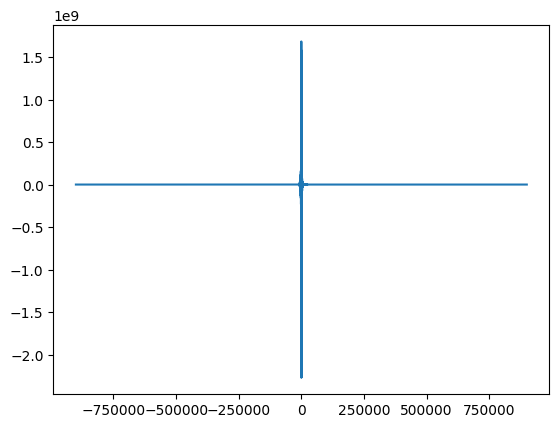

In [42]:
# fourier transform of one of the songs
plt.plot(getFrequencies(toBroadcast[0],broadcastSampleRate),fftAndShift(toBroadcast[0]))

In [43]:
broadcastSignal=broadcast(toBroadcast,broadcastSampleRate) #toBroadcast contains a list of all of the songs to broad

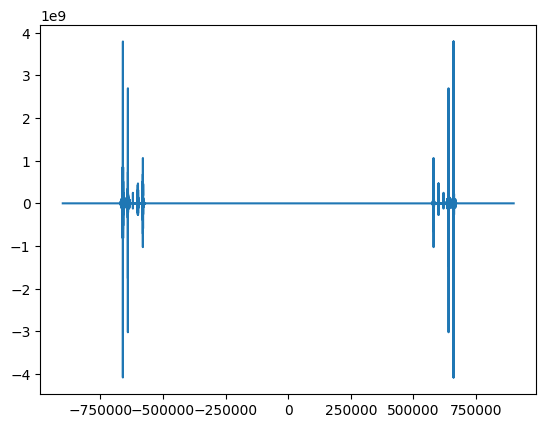

In [44]:
#fourier transform of the broacast signal
plt.plot(getFrequencies(broadcastSignal,broadcastSampleRate),np.fft.fftshift(np.fft.fft(broadcastSignal)))

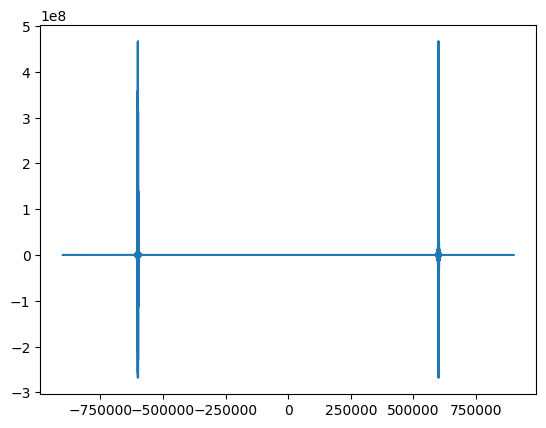

In [45]:
#de
desiredStationSignal=bandpassFilter(broadcastSignal,(600-10)*1000,(600+10)*1000,broadcastSampleRate)
plt.plot(getFrequencies(desiredStationSignal, broadcastSampleRate),np.fft.fftshift(np.fft.fft(desiredStationSignal)))

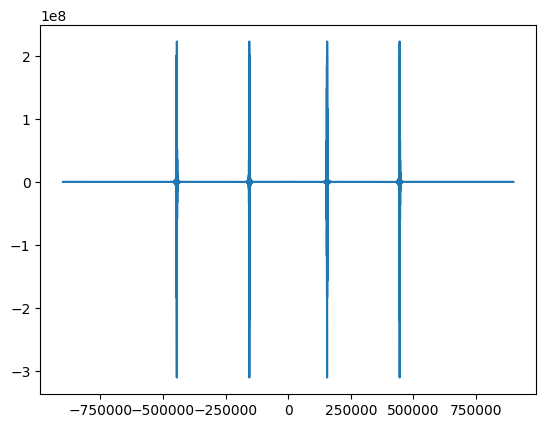

In [46]:
ifFreqSignal=sinusoidal_amplitude_modulation(desiredStationSignal,600-455,broadcastSampleRate)
plt.plot(frequencies,np.fft.fftshift(np.fft.fft(ifFreqSignal)))

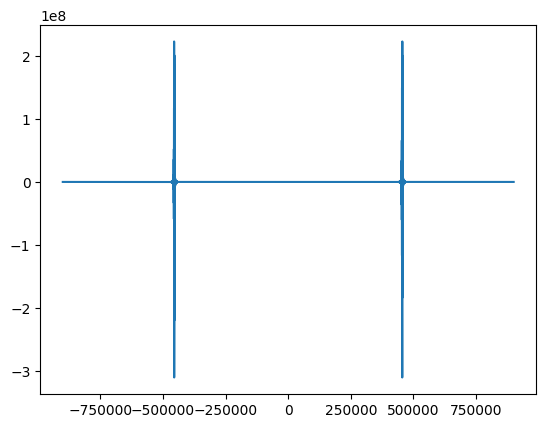

In [48]:
desiredStationSignal=bandpassFilter(ifFreqSignal,(455-10)*1000,(455+10)*1000,broadcastSampleRate)
plt.plot(getFrequencies(desiredStationSignal,broadcastSampleRate),np.fft.fftshift(np.fft.fft(desiredStationSignal)))

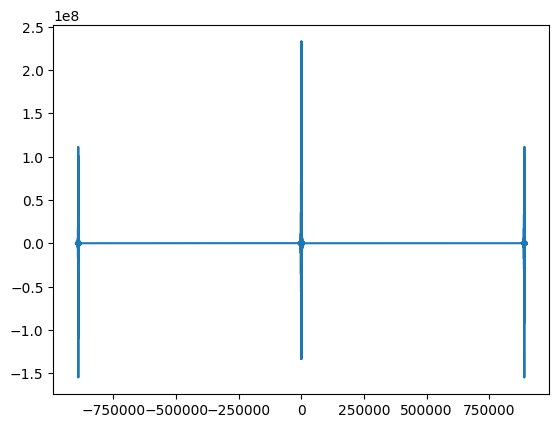

In [51]:
demodulatedSignal=sinusoidal_amplitude_modulation(desiredStationSignal,455,broadcastSampleRate)
plt.plot(getFrequencies(demodulatedSignal,broadcastSampleRate),fftAndShift(demodulatedSignal))

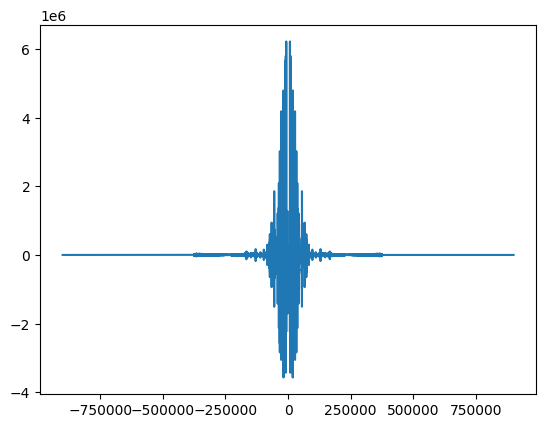

In [54]:
downsampledRecieved=scipy.signal.resample(demodulatedSignal, int((commonSampleRate/broadcastSampleRate)*len(broadcastSignal)))
display(Audio(downsampledRecieved,rate=commonSampleRate))
plt.plot(getFrequencies(downsampledRecieved,broadcastSampleRate),np.fft.fftshift(np.fft.fft(downsampledRecieved)))

**Question 3.2 (0.5 point)**: Let's put everything together: below, use the broadcast function to create a signal, and then pass it to the superheterodyne receiver to play your favourite station. 

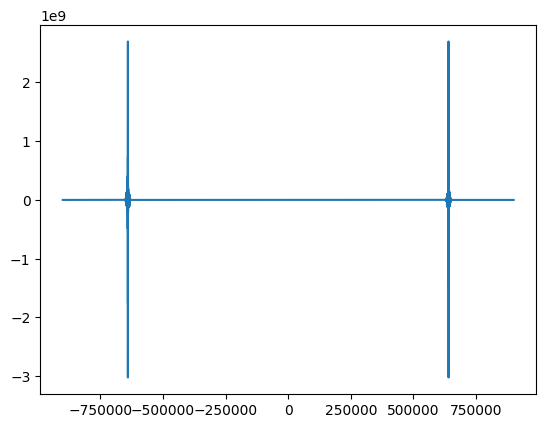

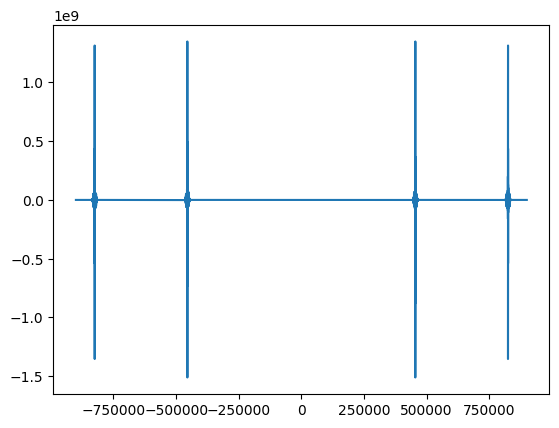

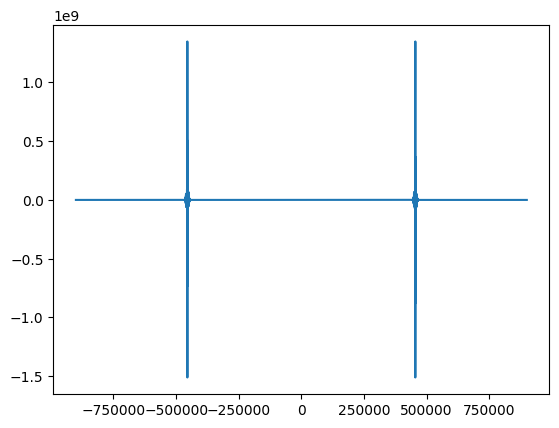

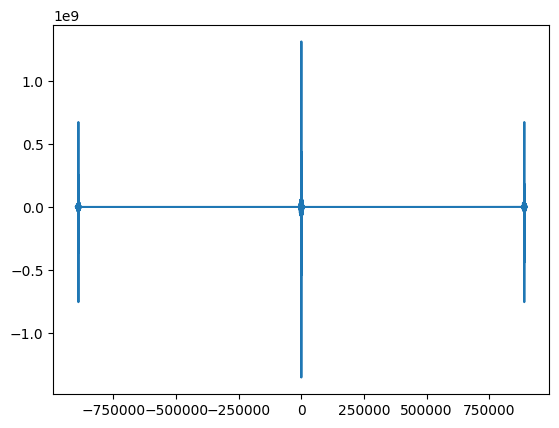

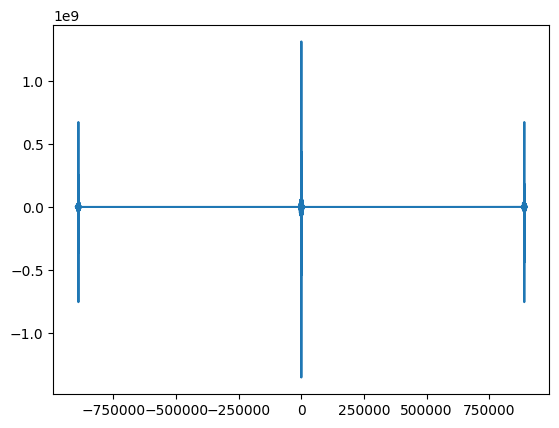

In [60]:
superhetOut=superhet_receiver(broadcastSignal,640,broadcastSampleRate)
# This still has the copies of the song's spectrum created at the edges and should be lowpass filtered out
plt.plot(getFrequencies(superhetOut,broadcastSampleRate),fftAndShift(superhetOut))

In [61]:
downsampledRecieved=scipy.signal.resample(superhetOut,int(commonSampleRate/broadcastSampleRate*len(superhetOut)))
Audio(downsampledRecieved,rate=commonSampleRate)